In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl

# 1. Đọc file dữ liệu

In [37]:
df = pd.read_pickle("../../data/interim/01_data_processed.pkl")

df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:08:05.280,0.016,0.980,-0.087,8.171,-7.073,8.110,B,bench,heavy,30
2019-01-11 15:08:05.360,0.011,0.974,-0.055,-4.756,8.232,4.329,B,bench,heavy,30
2019-01-11 15:08:05.440,-0.011,0.970,-0.086,-1.402,-0.915,-0.732,B,bench,heavy,30
2019-01-11 15:08:05.520,0.008,0.971,-0.073,3.415,-1.829,6.220,B,bench,heavy,30
2019-01-11 15:08:05.600,0.012,0.996,-0.051,-16.951,-10.366,4.512,B,bench,heavy,30
...,...,...,...,...,...,...,...,...,...,...
2019-01-20 17:33:27.440,-0.056,-1.026,-0.072,2.805,-11.951,0.366,E,row,medium,90
2019-01-20 17:33:27.520,-0.064,-1.036,-0.092,5.488,-0.488,-1.220,E,row,medium,90
2019-01-20 17:33:27.600,-0.022,-1.041,-0.004,-2.988,4.939,2.561,E,row,medium,90


# 2. Biểu diễn dữ liệu

In [3]:
mpl.style.use("seaborn-v0_8-deep")
mpl.rcParams["figure.figsize"] = (20, 5)
mpl.rcParams["figure.dpi"] = 100

## 2.1. Biểu diễn dữ liệu cảm biến của một bài tập

### 2.1.1. Bài tập Heavy Bench của người tập A

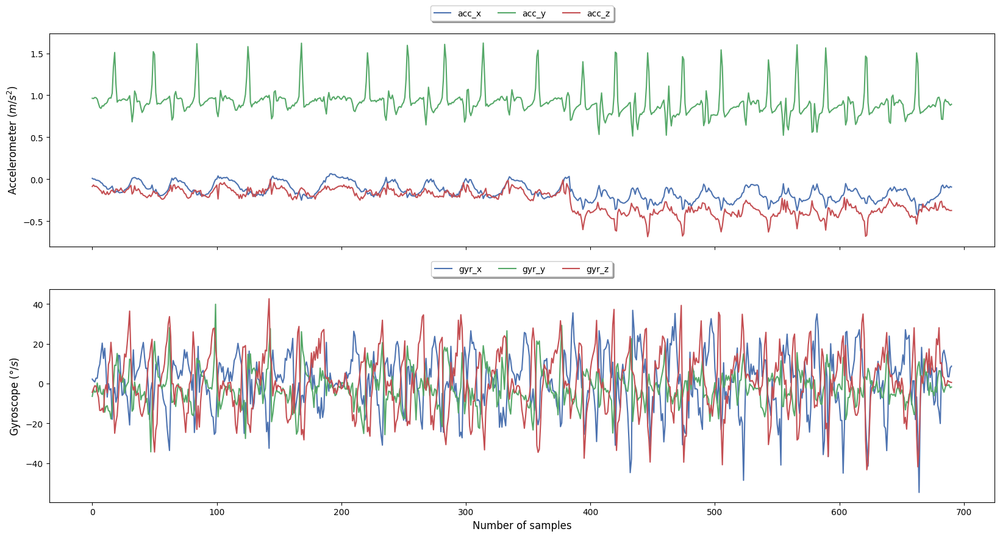

In [6]:
label = "bench"
participant = "A"
category = "heavy"
combined_plot_df = (
    df.query(f"label == '{label}'")
    .query(f"participant == '{participant}'")
    .query(f"category == '{category}'")
    .reset_index()
)

if len(combined_plot_df) > 0:
    fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(20, 10))
    combined_plot_df[["acc_x", "acc_y", "acc_z"]].plot(ax=ax[0])
    combined_plot_df[["gyr_x", "gyr_y", "gyr_z"]].plot(ax=ax[1])

    ax[0].legend(
        loc="upper center",
        bbox_to_anchor=(0.5, 1.15),
        ncol=3,
        fancybox=True,
        shadow=True,
    )
    ax[0].set_ylabel("Accelerometer ($m/s^2$)", fontsize=12)
    
    ax[1].legend(
        loc="upper center",
        bbox_to_anchor=(0.5, 1.15),
        ncol=3,
        fancybox=True,
        shadow=True,
    )
    ax[1].set_xlabel("Number of samples", fontsize=12)
    ax[1].set_ylabel("Gyroscope ($\degree/s$)", fontsize=12)

### 2.1.2. Biểu diễn một set trong bài tập

In [5]:
# Lấy thông tin set tập
set_df = df[df["set"] == 1]
set_df

,acc_x,acc_y,acc_z,gyr_x,gyr_y,gyr_z,participant,label,category,set
epoch (ms),,,,,,,,,,
2019-01-11 15:10:08.400,0.010,0.964,-0.087,2.2865,-6.4025,-4.3290,A,bench,heavy,1
2019-01-11 15:10:08.480,0.000,0.961,-0.069,1.4630,-2.8660,-2.5305,A,bench,heavy,1
2019-01-11 15:10:08.560,0.001,0.974,-0.087,0.8535,-4.2990,-1.0365,A,bench,heavy,1
2019-01-11 15:10:08.640,-0.012,0.971,-0.084,2.7745,-3.9935,-1.2500,A,bench,heavy,1
2019-01-11 15:10:08.720,-0.013,0.954,-0.094,2.7130,0.3355,-4.3905,A,bench,heavy,1
...,...,...,...,...,...,...,...,...,...,...
2019-01-11 15:10:24.480,0.027,0.970,-0.091,-2.0125,0.5790,-1.8905,A,bench,heavy,1
2019-01-11 15:10:24.560,0.010,0.990,-0.068,-1.1890,0.0305,-0.3050,A,bench,heavy,1
2019-01-11 15:10:24.640,0.011,0.978,-0.091,2.4695,-2.5910,5.3350,A,bench,heavy,1


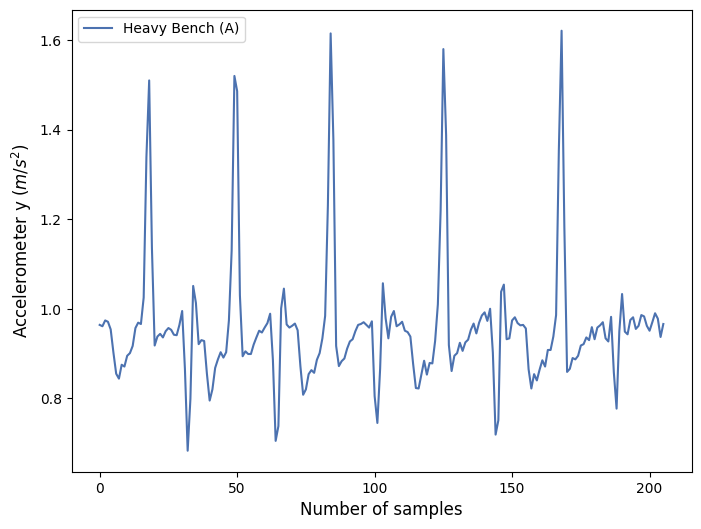

In [21]:
# Trực quan hóa dữ liệu
plt.figure(figsize=(8, 6))
plt.plot(set_df["acc_y"].reset_index(drop=True), label="Heavy Bench (A)")
plt.xlabel("Number of samples", fontsize=12)
plt.ylabel("Accelerometer y ($m/s^2$)", fontsize=12)
plt.legend()
plt.show()

### 2.1.3. Biểu diễn các bài tập
(Bench Press, Overhead Press, Squat, Deadlift, Barbell Row)

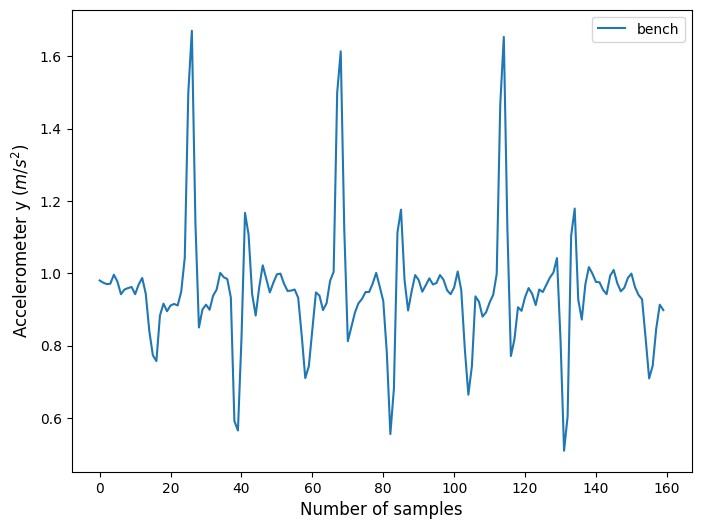

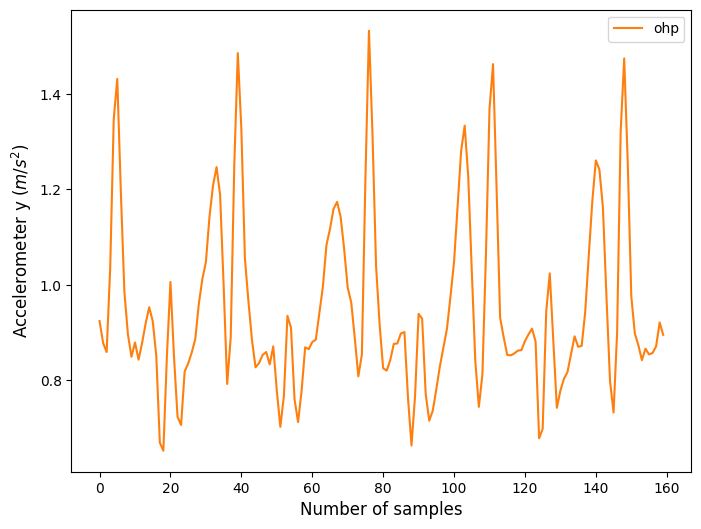

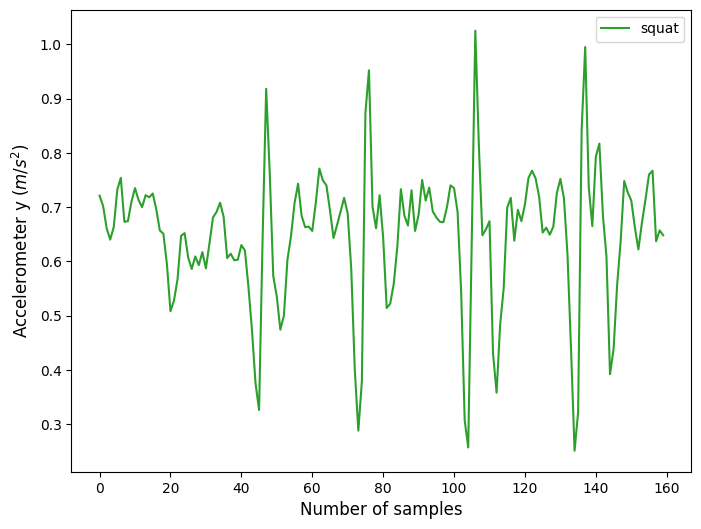

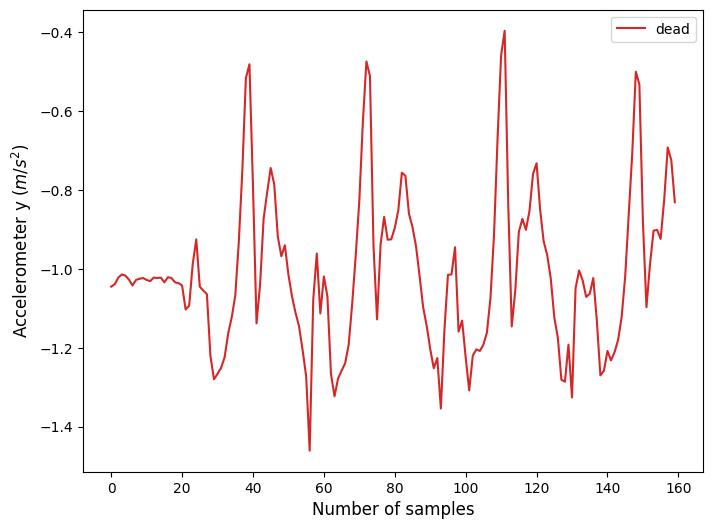

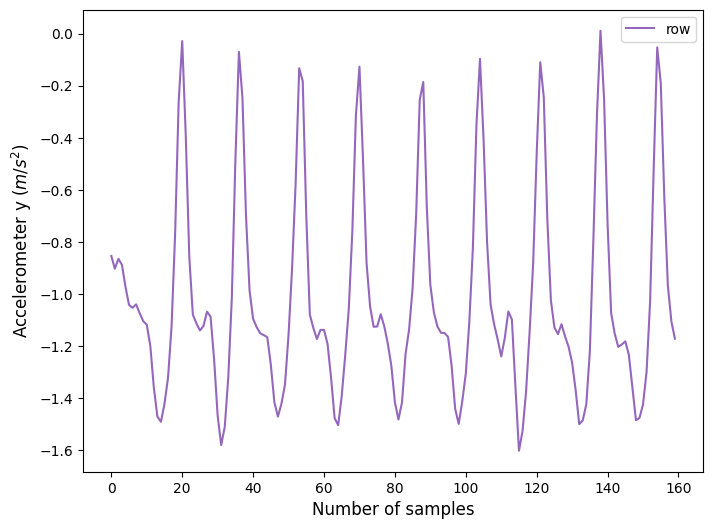

In [35]:
colors = plt.cm.tab10.colors

for idx, label in enumerate(df["label"].unique()):
    if label != 'rest':
        subset = df[df["label"] == label]
        fig, ax = plt.subplots(figsize=(8, 6))
        plt.plot(subset[:160]["acc_y"].reset_index(drop=True), label=label, color=colors[idx % len(colors)])
        plt.xlabel("Number of samples", fontsize=12)
        plt.ylabel("Accelerometer y ($m/s^2$)", fontsize=12)
        plt.legend()
        plt.show()

## 2.2. So sánh dữ liệu cảm biến của các người tập khác nhau trên cùng một bài tập

### 2.2.1. Các bài tập với mức tạ vừa
(Bench Press, Overhead Press, Squat, Deadlift, Barbell Row)

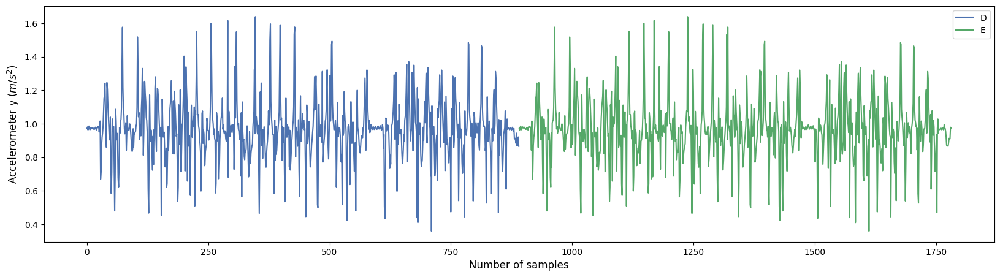

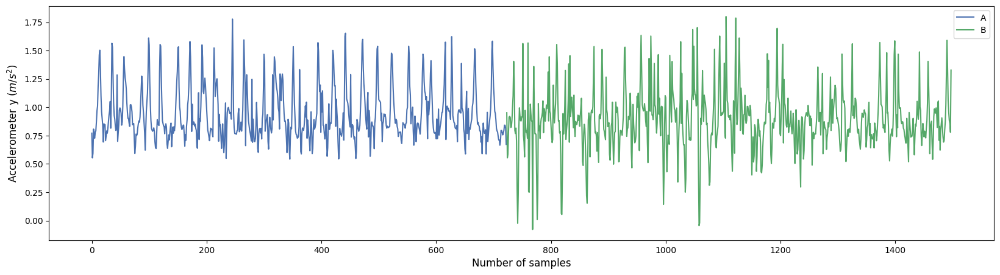

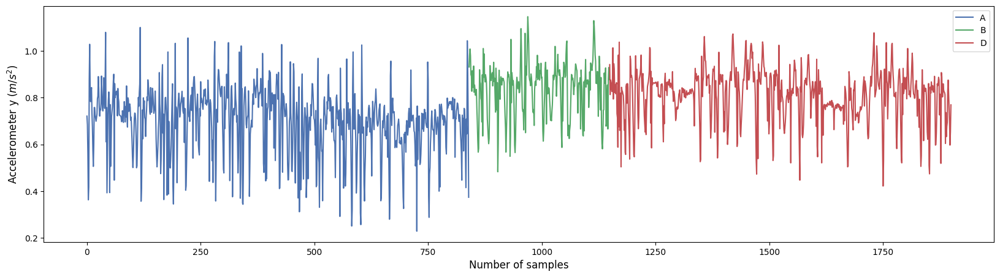

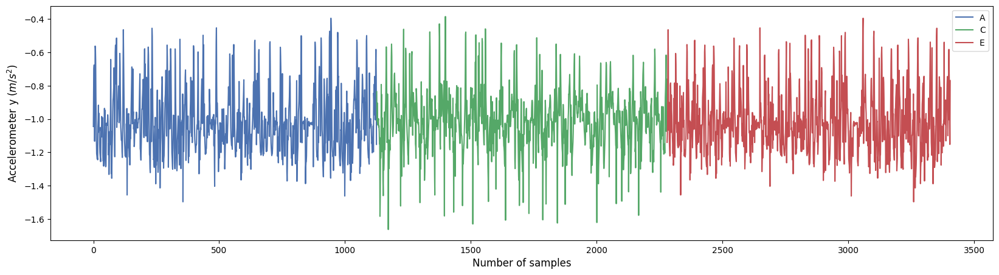

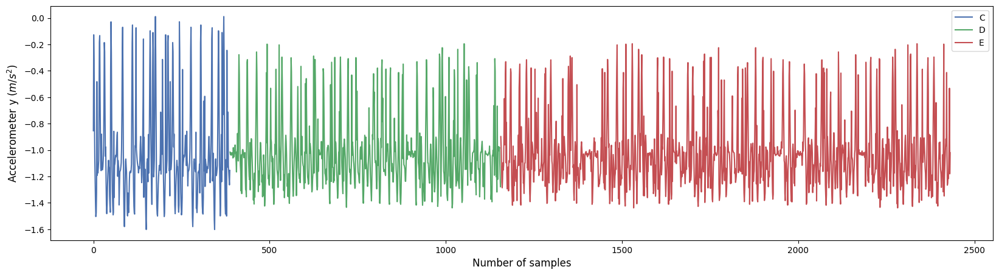

In [16]:
labels = df["label"].unique()
participants = df["participant"].unique()

for label in labels:
    category_df = df.query(f"label == '{label}'").query("category == 'medium'").sort_values("participant").reset_index()
    if len(category_df) > 0:
        fig, ax = plt.subplots()
        category_df.groupby(["participant"], group_keys=True)["acc_y"].plot()
        ax.set_ylabel("Accelerometer y ($m/s^2$)", fontsize=12)
        ax.set_xlabel("Number of samples", fontsize=12)
        plt.legend()

### 2.2.2. Bài tập với mức tạ nặng
(Bench Press, Overhead Press, Squat, Deadlift, Barbell Row)

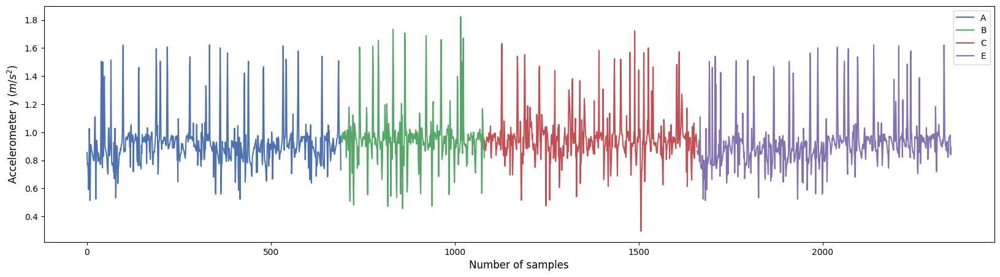

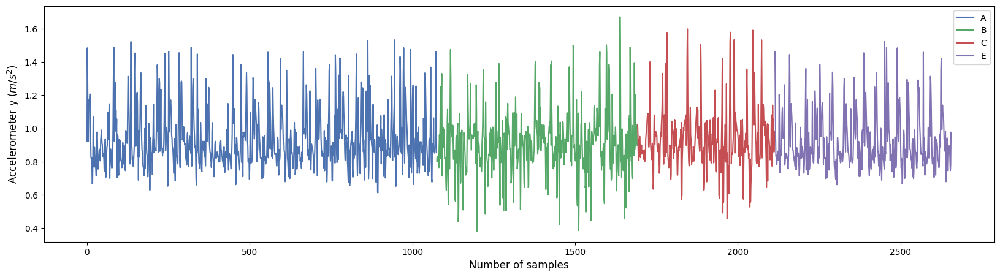

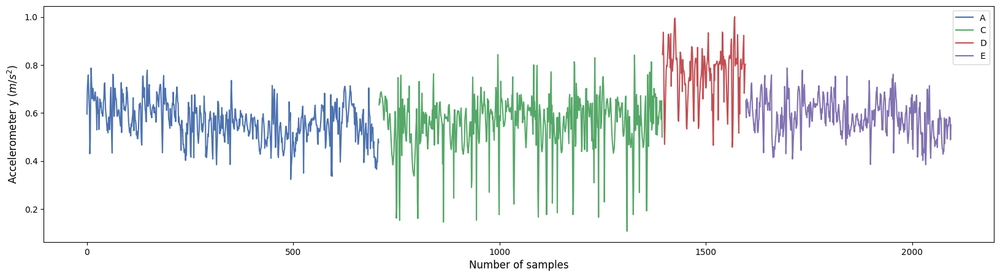

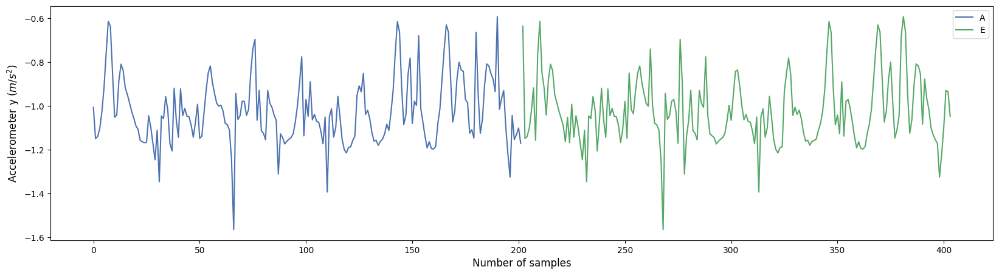

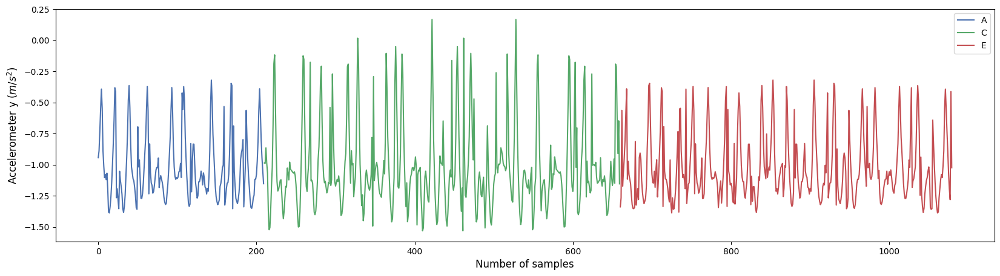

In [17]:
for label in labels:
    category_df = df.query(f"label == '{label}'").query("category == 'heavy'").sort_values("participant").reset_index()
    if len(category_df) > 0:
        fig, ax = plt.subplots()
        category_df.groupby(["participant"], group_keys=True)["acc_y"].plot()
        ax.set_ylabel("Accelerometer y ($m/s^2$)", fontsize=12)
        ax.set_xlabel("Number of samples", fontsize=12)
        plt.legend()

## 2.3. Biểu diễn dữ liệu cảm biến của tất cả các bài tập

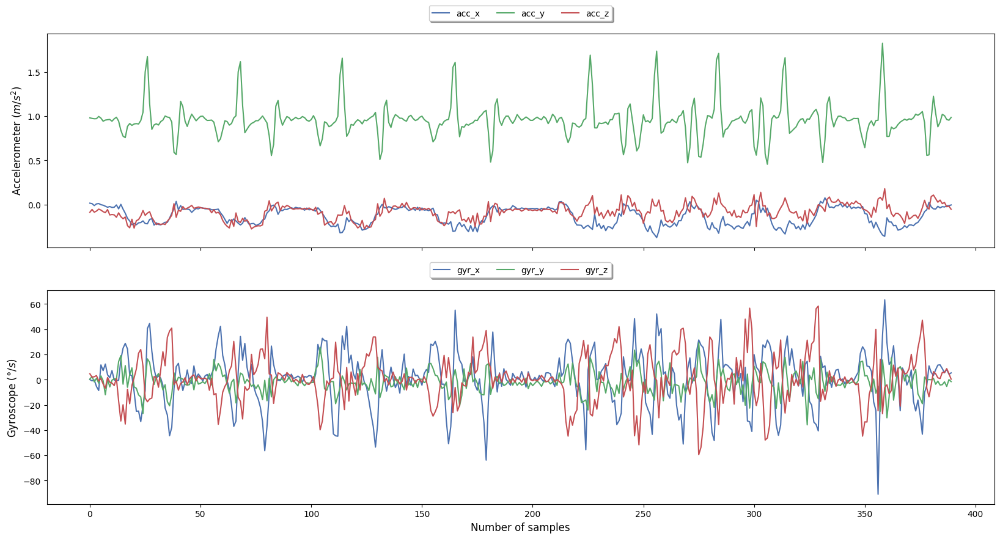

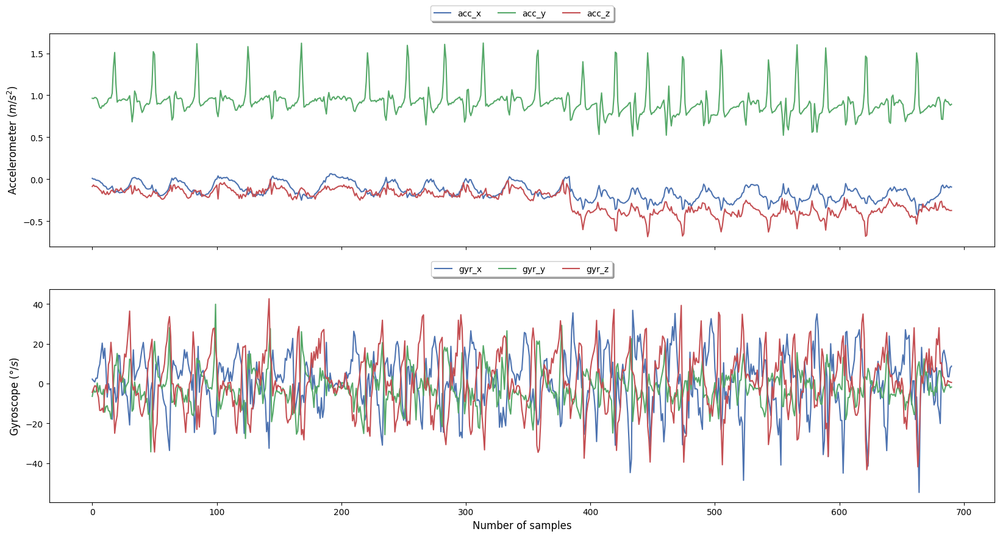

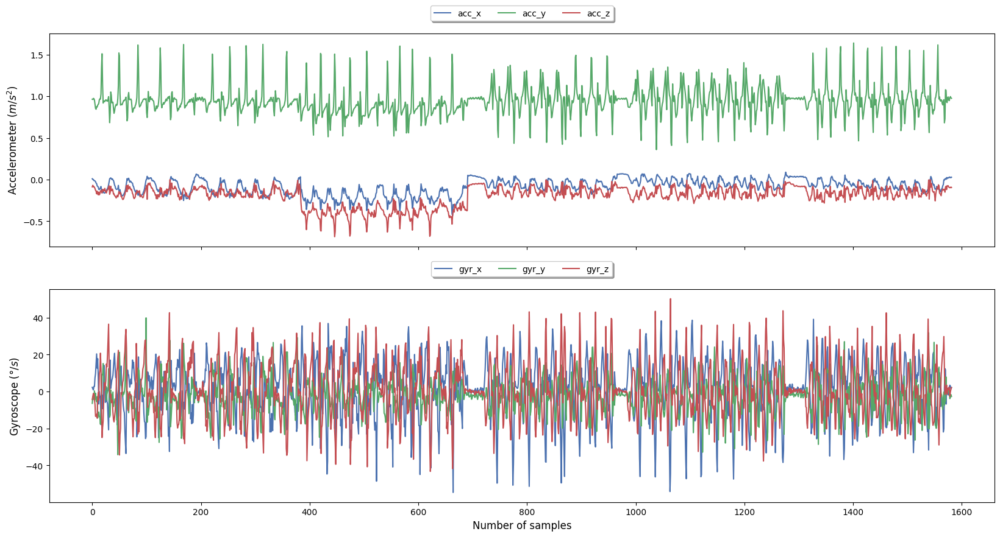

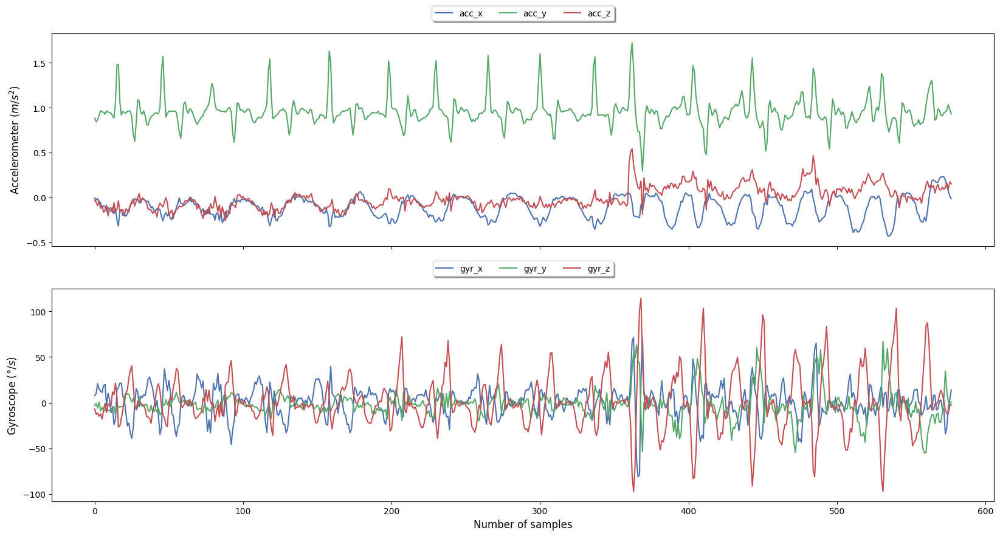

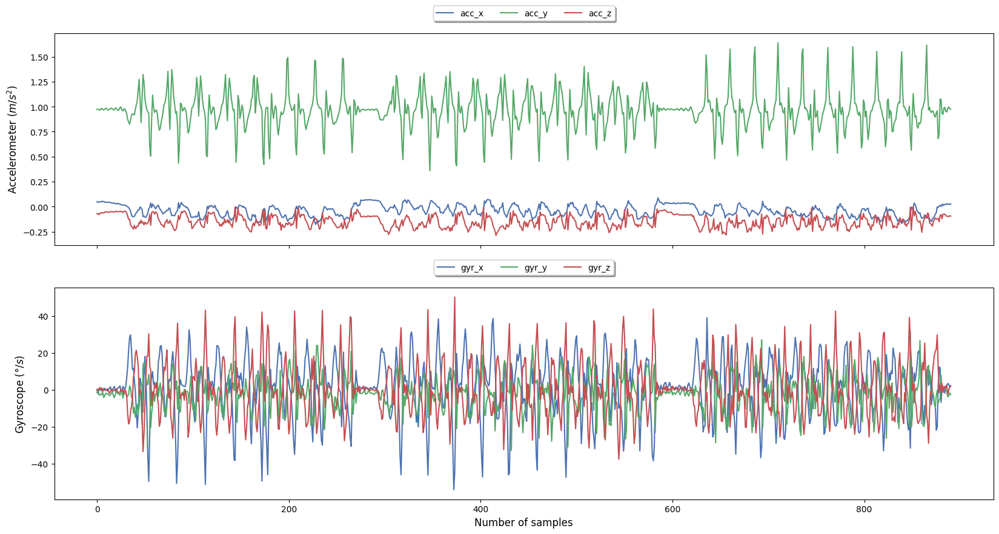

...

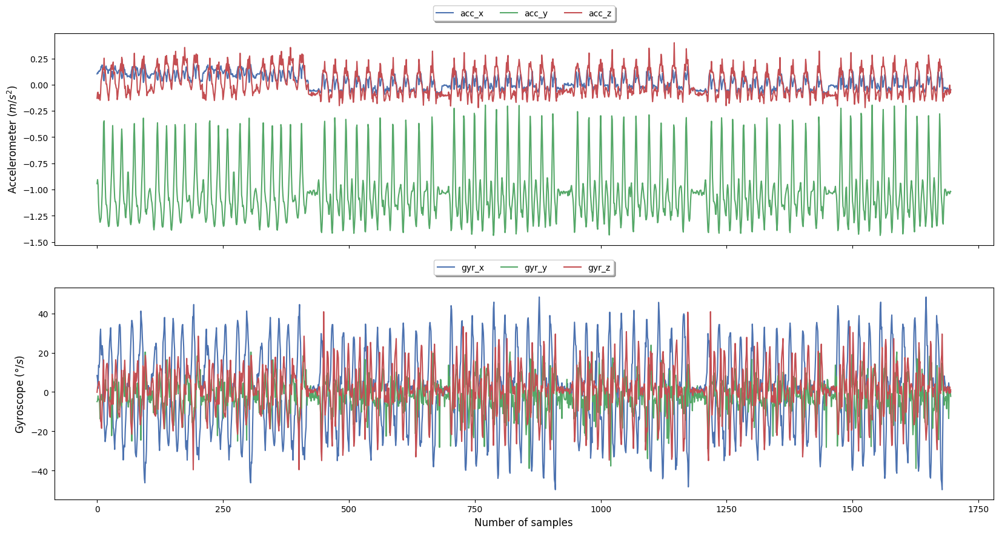

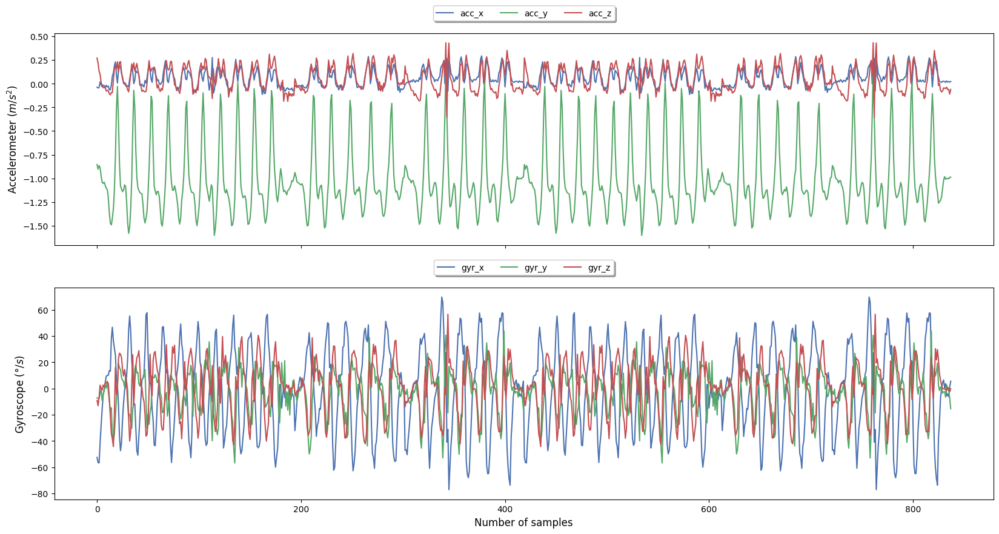

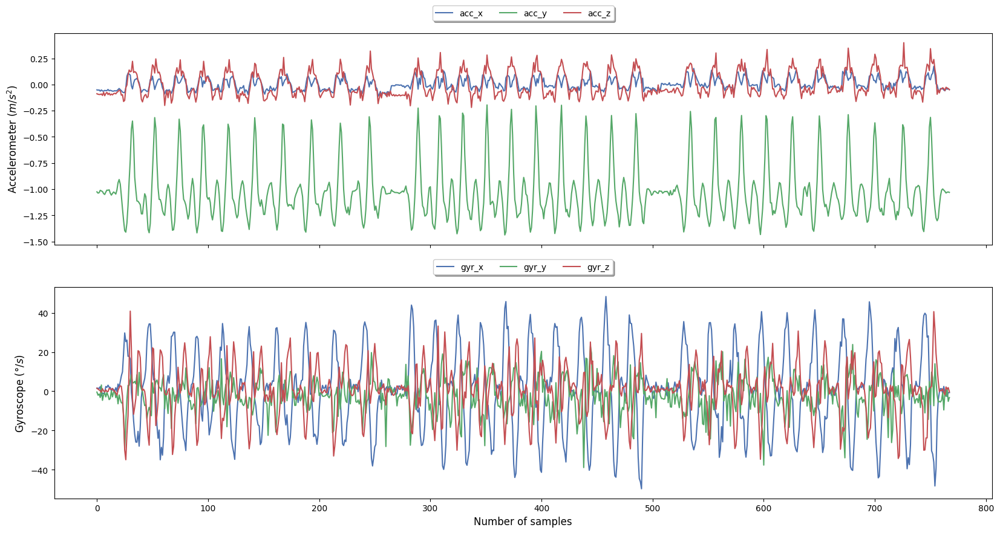

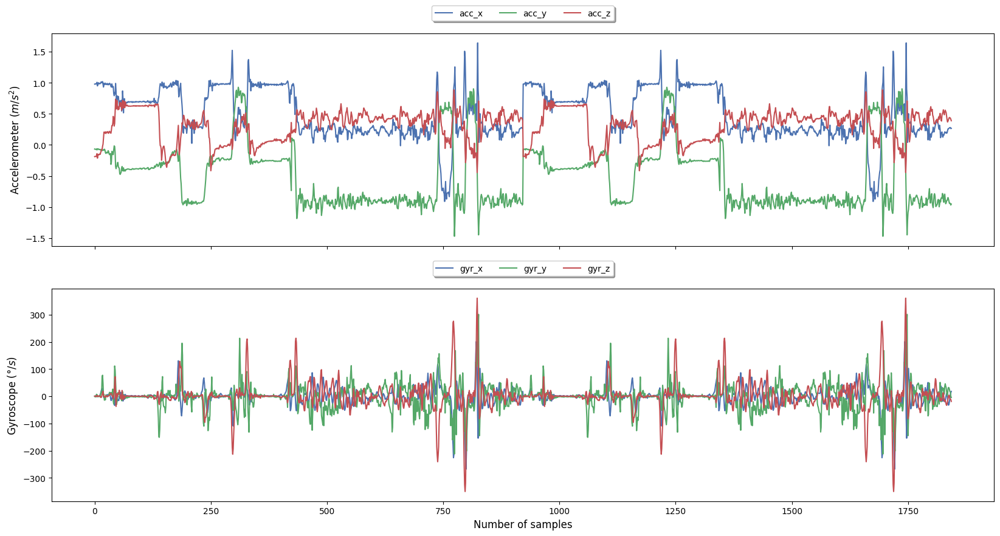

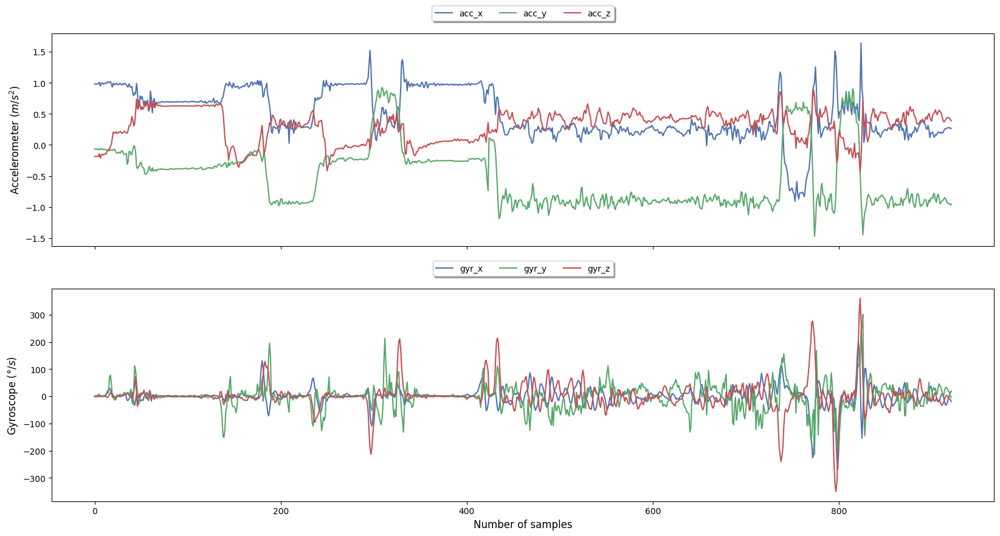

In [12]:
for label in labels:
    for participant in participants:
        combined_plot_df = (
            df.query(f"label == '{label}'")
            .query(f"participant == '{participant}'")
            .reset_index()
        )

        if len(combined_plot_df) > 0:
            fig, ax = plt.subplots(nrows=2, sharex=True, figsize=(20, 10))
            combined_plot_df[["acc_x", "acc_y", "acc_z"]].plot(ax=ax[0])
            combined_plot_df[["gyr_x", "gyr_y", "gyr_z"]].plot(ax=ax[1])

            ax[0].legend(
                loc="upper center",
                bbox_to_anchor=(0.5, 1.15),
                ncol=3,
                fancybox=True,
                shadow=True,
            )
            ax[0].set_ylabel("Accelerometer ($m/s^2$)", fontsize=12)
            
            ax[1].legend(
                loc="upper center",
                bbox_to_anchor=(0.5, 1.15),
                ncol=3,
                fancybox=True,
                shadow=True,
            )
            ax[1].set_xlabel("Number of samples", fontsize=12)
            ax[1].set_ylabel("Gyroscope ($\degree/s$)", fontsize=12)

            plt.savefig(f"../../reports/figures/{label.title()} ({participant}).png")
            plt.show()